# **Introducción al análisis de datos en Python** 
#### Profe: Santiago Neira
## Clase 6. Más visualizaciones y repaso de Pandas

### Objetivos de la clase

1. Repasar los gráficos principales de **Seaborn** aplicados a datos reales
2. Entender qué es una **tabla pivote** y cómo construirla con Pandas
3. Crear gráficos interactivos con **Plotly**, partiendo de equivalentes en Seaborn
4. Introducción a **GeoPandas** para visualización geográfica
5. Poner en práctica lo aprendido con un **taller** de análisis de vuelos

---
## Bloque 1: Repaso de Seaborn con datos de propiedades

En la clase anterior aprendimos los fundamentos de Matplotlib y Seaborn. Hoy vamos a reforzar esos conceptos aplicándolos a un dataset real de propiedades de finca raíz en Colombia.

### Configuración inicial

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_theme(style="darkgrid")

### Cargamos los datos

Trabajaremos con datos de propiedades de finca raíz en Colombia. Estos fueron extraidos de una página de clasificados donde cada usuario podía poner anuncios de venta o arriendo de distintos tipos de propiedades. Las columnas relevantes con las que se cuenta en esta base son:

- `start_date` y `end_date`: La fecha de inicio y de fin de la publicación
- `created_on`: La fecha en la que se realizó la publicación
- `lat` y `lon`: Las coordenadas geográficas de la propiedad ofrecida
- `l1`, `l2`, `l3`, `l4`: Niveles geográficos (país, departamento, ciudad, barrio)
- `rooms`, `bedrooms`, `bathrooms`: Número de cuartos, habitaciones y baños
- `surface_total`, `surface_covered`: Área total y área cubierta
- `price`, `currency`: Precio y moneda
- `property_type`: Tipo de propiedad (Casa, Apartamento, etc.)
- `operation_type`: Tipo de operación (Venta, Arriendo)

In [2]:
propiedades = pd.read_csv('./data/co_properties.csv.zip', compression='zip')

In [3]:
pd.set_option('display.max_columns', None)
propiedades.head()

,id,ad_type,start_date,end_date,created_on,lat,lon,l1,l2,l3,l4,l5,l6,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,currency,price_period,title,description,property_type,operation_type
0,KsjahK62rxcYKXXQjOdkqw==,Propiedad,2020-10-07,2021-10-09,2020-10-07,3.9210,-76.506000,Colombia,Valle del Cauca,NaN,NaN,NaN,NaN,NaN,6.0,7.0,NaN,NaN,1.300000e+09,COP,NaN,Casa Campestre en venta en darien 3469064,"HERMOSA CASA CAMPESTRE, &Aacute;REA 6,000 MT, ...",Casa,Venta
1,Y+gsBZYq1zu5NoR3V5oUGA==,Propiedad,2020-10-07,2021-01-06,2020-10-07,3.3577,-76.541811,Colombia,Valle del Cauca,Cali,Ciudad Jardín,NaN,NaN,NaN,NaN,7.0,NaN,NaN,2.800000e+09,COP,NaN,Casa en ciudsd jardin,Casa independiente con posiciona en ciudad jar...,Casa,Venta
2,Jpzqxj8/Vgf3Aa5ASxUBNg==,Propiedad,2020-10-07,2020-10-07,2020-10-07,3.3577,-76.541811,Colombia,Valle del Cauca,Cali,Ciudad Jardín,NaN,NaN,NaN,NaN,7.0,NaN,NaN,2.800000e+09,COP,Mensual,Casa en ciudsd jardin,Casa independiente con posiciona en ciudad jar...,Casa,Venta
3,ieuFnkFx/yHDD66iMV14Gw==,Propiedad,2020-10-07,2021-04-12,2020-10-07,3.3640,-76.538000,Colombia,Valle del Cauca,Cali,Ciudad Jardín,NaN,NaN,NaN,5.0,8.0,NaN,NaN,3.500000e+09,COP,NaN,Casa en venta en pance 1630426,"EXCELENTE CASA - LOTE 6,373 MT, EN OBRA GRIS U...",Casa,Venta
4,g4u5JM+hAHEk8SukRSjMzg==,Propiedad,2020-10-07,9999-12-31,2020-10-07,3.3910,-76.517000,Colombia,Valle del Cauca,Cali,NaN,NaN,NaN,NaN,8.0,9.0,NaN,NaN,4.800000e+08,COP,NaN,CASA EXTERNA BARRIO CIUDAD 2000,"CASA EXTERNA EN EL BARRIO CIUDAD 2000,CONSTRUI...",Casa,Venta


Filtremos las propiedades de venta en Cali en pesos colombianos para trabajar con un subconjunto manejable:

In [4]:
propiedades_venta_cali = propiedades.loc[
    (propiedades.l3 == 'Cali') & 
    (propiedades.operation_type == 'Venta') & 
    (propiedades.currency == 'COP')
]
print(f'Propiedades filtradas: {propiedades_venta_cali.shape[0]:,} filas')
propiedades_venta_cali.head()

Propiedades filtradas: 59,544 filas


,id,ad_type,start_date,end_date,created_on,lat,lon,l1,l2,l3,l4,l5,l6,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,currency,price_period,title,description,property_type,operation_type
1,Y+gsBZYq1zu5NoR3V5oUGA==,Propiedad,2020-10-07,2021-01-06,2020-10-07,3.3577,-76.541811,Colombia,Valle del Cauca,Cali,Ciudad Jardín,NaN,NaN,NaN,NaN,7.0,NaN,NaN,2.800000e+09,COP,NaN,Casa en ciudsd jardin,Casa independiente con posiciona en ciudad jar...,Casa,Venta
2,Jpzqxj8/Vgf3Aa5ASxUBNg==,Propiedad,2020-10-07,2020-10-07,2020-10-07,3.3577,-76.541811,Colombia,Valle del Cauca,Cali,Ciudad Jardín,NaN,NaN,NaN,NaN,7.0,NaN,NaN,2.800000e+09,COP,Mensual,Casa en ciudsd jardin,Casa independiente con posiciona en ciudad jar...,Casa,Venta
3,ieuFnkFx/yHDD66iMV14Gw==,Propiedad,2020-10-07,2021-04-12,2020-10-07,3.3640,-76.538000,Colombia,Valle del Cauca,Cali,Ciudad Jardín,NaN,NaN,NaN,5.0,8.0,NaN,NaN,3.500000e+09,COP,NaN,Casa en venta en pance 1630426,"EXCELENTE CASA - LOTE 6,373 MT, EN OBRA GRIS U...",Casa,Venta
4,g4u5JM+hAHEk8SukRSjMzg==,Propiedad,2020-10-07,9999-12-31,2020-10-07,3.3910,-76.517000,Colombia,Valle del Cauca,Cali,NaN,NaN,NaN,NaN,8.0,9.0,NaN,NaN,4.800000e+08,COP,NaN,CASA EXTERNA BARRIO CIUDAD 2000,"CASA EXTERNA EN EL BARRIO CIUDAD 2000,CONSTRUI...",Casa,Venta
5,+S9T8NKJ/yyndMxxRz1emQ==,Propiedad,2020-10-07,9999-12-31,2020-10-07,3.4130,-76.544000,Colombia,Valle del Cauca,Cali,NaN,NaN,NaN,NaN,10.0,10.0,NaN,NaN,1.400000e+09,COP,NaN,CASA PARA VENTA NUEVA TEQUENDAMA,"CASA EXTERNA CONSTRUIDA EN TRES PISOS , EN EL ...",Casa,Venta


### 1.1 Diagrama de dispersión y distribución (`jointplot`)

**Pregunta:** ¿Cómo se relacionan el precio y el área total de las propiedades en venta en Cali?

El `jointplot` de Seaborn combina un gráfico de dispersión con histogramas marginales. Esto nos permite ver simultáneamente:
- La **relación** entre dos variables numéricas (en el centro)
- La **distribución** de cada variable por separado (en los márgenes)

Además, podemos usar el parámetro `hue` para colorear los puntos según una variable categórica.

> **Marca (exportaci?n):** En la siguiente celda se muestra c?mo guardar el `jointplot` a un archivo `.png`.

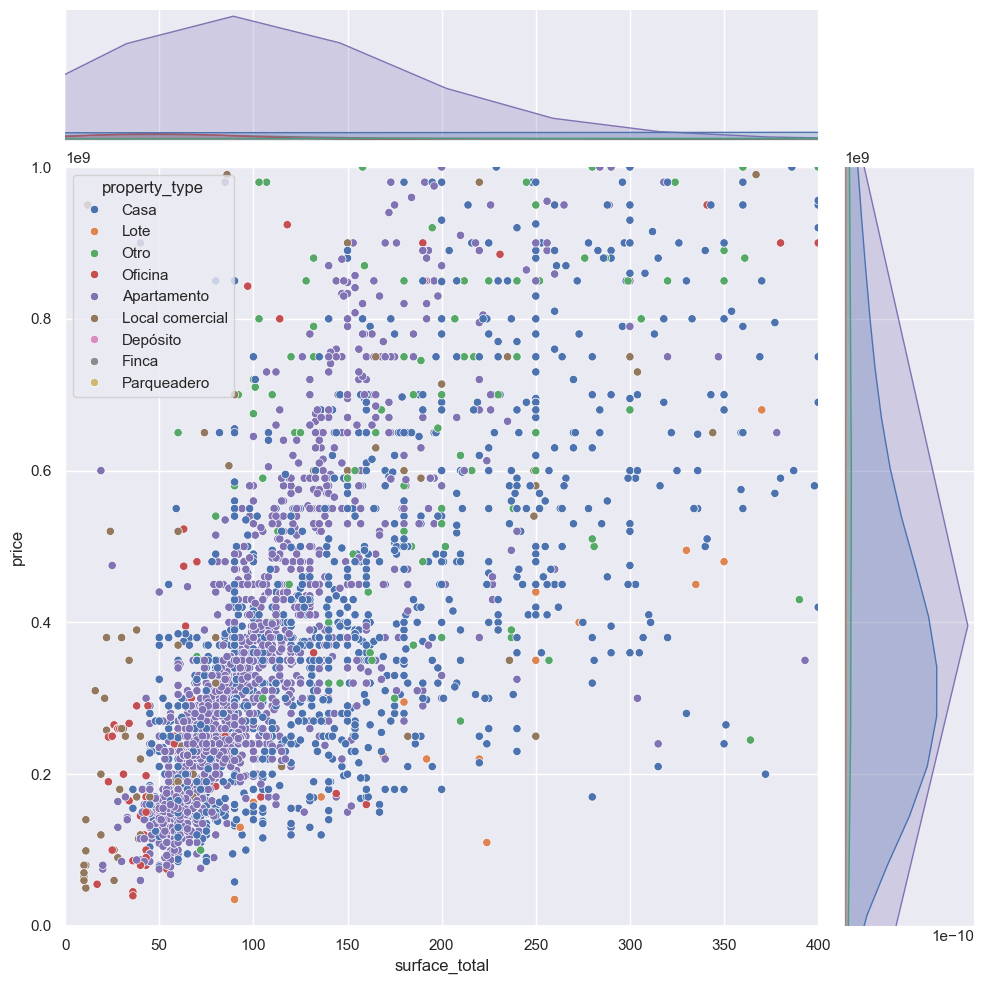

In [ ]:
import os
os.makedirs('./exports', exist_ok=True)

g = sns.jointplot(
    data=propiedades_venta_cali,
    x='surface_total', 
    y='price',
    xlim=(0, 400), 
    ylim=(0, 1e9),
    height=10, 
    hue='property_type'
)



In [49]:
### Exportemos la figura
g.figure.savefig('./exports/jointplot_precio_area.png', dpi=300, bbox_inches='tight')
g

**¿Qué observamos?**
- La mayoría de propiedades se concentran en áreas pequeñas (< 200 m²) y precios bajos
- Los apartamentos tienden a tener menor área que las casas
- Existe una relación positiva: a mayor área, mayor precio

### 1.2 Introducción: Mapa de calor de correlaciones

Antes de pasar a tablas pivote, aprenderemos a usar `heatmap` en Seaborn para visualizar **matrices de correlación**. Este tipo de gráfico nos ayuda a identificar qué tan relacionadas linealmente están las variables numéricas entre sí.

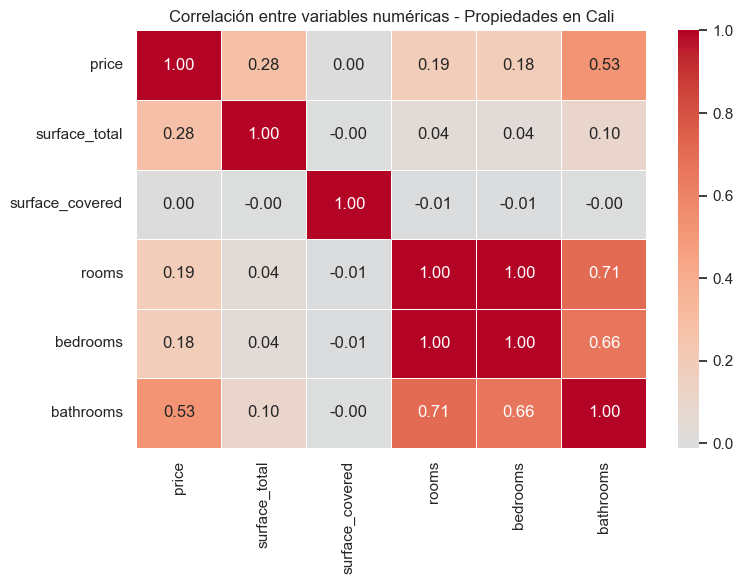

In [6]:
# Seleccionamos variables numéricas relevantes
cols_numericas = ['price', 'surface_total', 'surface_covered', 'rooms', 'bedrooms', 'bathrooms']
corr = propiedades_venta_cali[cols_numericas].corr()

plt.figure(figsize=(8, 6))
sns.heatmap(corr, annot=True, fmt='.2f', cmap='coolwarm', center=0, linewidths=0.5)
plt.title('Correlación entre variables numéricas - Propiedades en Cali')
plt.tight_layout()
plt.show()

**Recordemos:**
- Valores cercanos a **1** indican correlación positiva fuerte
- Valores cercanos a **-1** indican correlación negativa fuerte
- Valores cercanos a **0** indican poca o ninguna correlación lineal

### Complemento: Pairplot con las mismas variables

Ahora usemos un `pairplot` para explorar las relaciones **par a par** entre las mismas variables numéricas del `heatmap`. Esto permite ver patrones, dispersión y posibles valores atípicos.

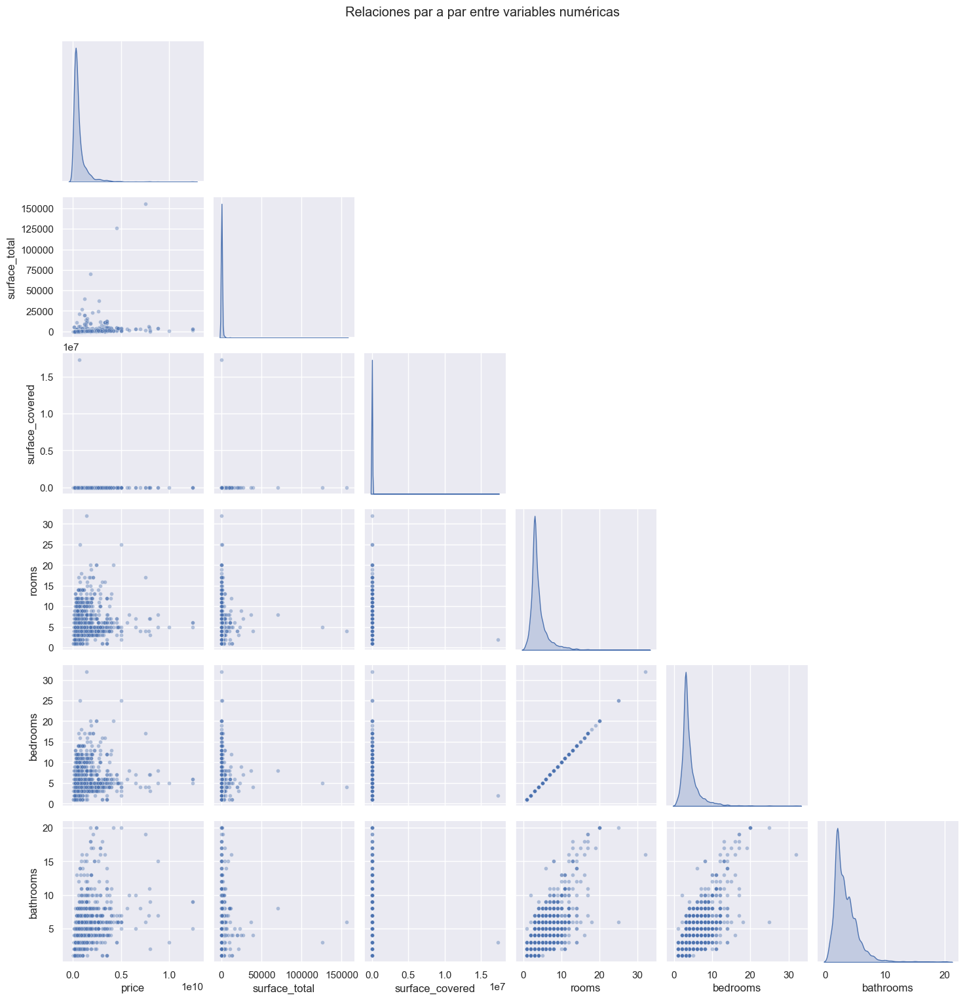

In [8]:
# Pairplot con las mismas columnas numéricas del heatmap
pairplot_data = propiedades_venta_cali[cols_numericas].dropna()

# Si hay muchas filas, tomamos una muestra para que el gráfico sea más liviano
#tam_muestra = min(1200, len(pairplot_data))
#pairplot_data = pairplot_data.sample(tam_muestra, random_state=42)

g = sns.pairplot(
    pairplot_data,
    corner=True,
    diag_kind='kde',
    plot_kws={'alpha': 0.4, 's': 18}
)
g.fig.suptitle('Relaciones par a par entre variables numéricas', y=1.02)
plt.show()

---
## Bloque 2: Tablas Pivote

Una **tabla pivote** (pivot table) es una herramienta fundamental para resumir y reorganizar datos. Si alguna vez han usado tablas dinámicas en Excel, el concepto es exactamente el mismo.

### ¿Qué es una tabla pivote?

Una tabla pivote toma datos "largos" (muchas filas) y los reorganiza en un formato de tabla cruzada, donde:
- Las **filas** representan una variable categórica
- Las **columnas** representan otra variable categórica
- Los **valores** son una agregación (promedio, suma, conteo, etc.) de una variable numérica

**Ejemplo conceptual:**

Supongamos que tenemos datos de ventas:

| Barrio | Baños | Precio |
|--------|-------|--------|
| Norte  | 1     | 200M   |
| Norte  | 2     | 350M   |
| Sur    | 1     | 150M   |
| Sur    | 2     | 280M   |

La tabla pivote con `index='Barrio'`, `columns='Baños'` y `values='Precio'` sería:

| Barrio | 1 baño | 2 baños |
|--------|--------|--------|
| Norte  | 200M   | 350M   |
| Sur    | 150M   | 280M   |

### Construyendo una tabla pivote paso a paso

Queremos entender cómo varía el **precio promedio** de propiedades residenciales en Cali en función de dos variables:
- El **sector** (barrio, columna `l4`)
- El **número de baños** (columna `bathrooms`)

Vamos paso a paso.

**Paso 1:** Filtrar solo casas y apartamentos, y seleccionar las columnas que necesitamos:

In [9]:
# Filtramos por Casa, Apartamento y nos aseguramos de eliminar los valores nulos
datos_vivienda = propiedades_venta_cali.loc[
    propiedades_venta_cali.property_type.isin(['Casa', 'Apartamento']),
    ['bathrooms', 'l4', 'price']
].dropna()

print(f'Registros: {len(datos_vivienda):,}')
datos_vivienda.head()

Registros: 9,112


,bathrooms,l4,price
1,7.0,Ciudad Jardín,2.800000e+09
2,7.0,Ciudad Jardín,2.800000e+09
3,8.0,Ciudad Jardín,3.500000e+09
7,7.0,San Fernando Nuevo,5.300000e+08
408,2.0,San Fernando Nuevo,4.500000e+08


**Paso 2:** Agrupar por barrio y número de baños, calculando el precio promedio:

In [10]:
# Calculamos el precio promedio por barrio y número de baños
precio_por_barrio_banos = (
    datos_vivienda
    .groupby(['l4', 'bathrooms'])
    .mean()
    .reset_index()
)
precio_por_barrio_banos.head(10)

,l4,bathrooms,price
0,Caney,1.0,1.458000e+08
1,Caney,2.0,2.079463e+08
2,Caney,3.0,3.395942e+08
3,Caney,4.0,4.615980e+08
4,Caney,5.0,4.181250e+08
5,Caney,6.0,5.516667e+08
6,Caney,7.0,7.833333e+08
7,Caney,8.0,8.600000e+08
8,Caney,11.0,9.000000e+08
9,Ciudad Jardín,1.0,2.170180e+08


**Paso 3:** Crear la tabla pivote con `.pivot()`

La función `.pivot()` reorganiza el DataFrame:
- `index`: la variable que va en las filas (barrio)
- `columns`: la variable que va en las columnas (baños)
- `values`: el valor numérico que llena la tabla (precio)

In [12]:
# Limpiamos los datos para la tabla pivote (evitando SettingWithCopyWarning)
propiedades_venta_cali = propiedades_venta_cali.dropna(subset=['bathrooms', 'l4']).copy()
propiedades_venta_cali.loc[:, 'bathrooms'] = propiedades_venta_cali['bathrooms'].astype(int)

In [13]:
# Construimos la tabla pivote
bathrooms_sector = (
    propiedades_venta_cali
    .loc[propiedades_venta_cali.property_type.isin(['Casa', 'Apartamento']),
         ['bathrooms', 'l4', 'price']]
    .dropna()
    .groupby(['l4', 'bathrooms']).mean().reset_index()
    .pivot(index='l4', columns='bathrooms', values='price')
)

bathrooms_sector

bathrooms,1,2,3,4,5,6,7,8,9,10,11,12,13,15,16,17
l4,,,,,,,,,,,,,,,,
Caney,1.458000e+08,2.079463e+08,3.395942e+08,4.615980e+08,4.181250e+08,5.516667e+08,7.833333e+08,8.600000e+08,NaN,NaN,9.000000e+08,NaN,NaN,NaN,NaN,NaN
Ciudad Jardín,2.170180e+08,3.190017e+08,6.249570e+08,9.696532e+08,1.278468e+09,1.486052e+09,1.866548e+09,2.785385e+09,3.232188e+09,2.007500e+09,NaN,NaN,2.300000e+09,NaN,3.200000e+09,NaN
El Ingenio,2.979394e+08,3.226870e+08,4.062922e+08,5.725489e+08,7.658203e+08,9.429833e+08,9.542222e+08,1.015833e+09,9.237500e+08,1.121453e+09,NaN,NaN,NaN,NaN,NaN,NaN
El Limonar,1.424433e+08,2.484484e+08,3.258182e+08,6.790000e+08,5.087500e+08,NaN,7.825000e+08,9.000000e+08,NaN,1.200000e+09,NaN,NaN,NaN,NaN,NaN,NaN
La Flora,1.652478e+08,3.317914e+08,4.568966e+08,5.265660e+08,5.673750e+08,7.033333e+08,NaN,NaN,8.500000e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Lili,1.372123e+08,2.141108e+08,3.274022e+08,3.881196e+08,5.357097e+08,8.537037e+08,NaN,NaN,NaN,1.313333e+09,NaN,NaN,NaN,NaN,NaN,NaN
Pance,1.104375e+09,5.168400e+08,8.588539e+08,1.140671e+09,1.196044e+09,2.010657e+09,2.148537e+09,2.776667e+09,7.533333e+09,3.521429e+09,7.911750e+09,3.500000e+09,NaN,8.800000e+09,NaN,2.800000e+09
San Fernando Nuevo,1.361667e+08,3.206632e+08,5.736020e+08,4.210000e+08,6.387143e+08,1.670000e+09,5.300000e+08,6.500000e+08,NaN,6.800000e+08,NaN,NaN,NaN,NaN,NaN,NaN
San Fernando Viejo,1.723333e+08,3.422628e+08,4.629165e+08,5.500862e+08,6.761290e+08,8.350000e+08,8.650000e+08,8.375000e+08,NaN,1.100000e+09,NaN,NaN,NaN,NaN,NaN,NaN


Observe que:
- Cada **fila** es un barrio de Cali
- Cada **columna** es un número de baños (1, 2, 3, ...)
- Cada **celda** contiene el precio promedio para esa combinación
- Los valores `NaN` indican que no hay datos para esa combinación

> **Tip:** También existe `pd.pivot_table()` que permite especificar la función de agregación directamente (sin necesidad de hacer `groupby` antes). Sin embargo, el enfoque paso a paso con `groupby` + `pivot` es más transparente para entender qué está pasando.
>
> **Marca (exportación):** En la celda siguiente se exporta la tabla pivoteada a `.csv` y `.xlsx`.

In [15]:
# Equivalente con pd.pivot_table()
bathrooms_sector_pt = pd.pivot_table(
    propiedades_venta_cali.loc[
        propiedades_venta_cali.property_type.isin(['Casa', 'Apartamento']),
        ['l4', 'bathrooms', 'price']
    ],
    index='l4',
    columns='bathrooms',
    values='price',
    aggfunc='mean'
)

bathrooms_sector_pt

bathrooms,1,2,3,4,5,6,7,8,9,10,11,12,13,15,16,17
l4,,,,,,,,,,,,,,,,
Caney,1.458000e+08,2.079463e+08,3.395942e+08,4.615980e+08,4.181250e+08,5.516667e+08,7.833333e+08,8.600000e+08,NaN,NaN,9.000000e+08,NaN,NaN,NaN,NaN,NaN
Ciudad Jardín,2.170180e+08,3.190017e+08,6.249570e+08,9.696532e+08,1.278468e+09,1.486052e+09,1.866548e+09,2.785385e+09,3.232188e+09,2.007500e+09,NaN,NaN,2.300000e+09,NaN,3.200000e+09,NaN
El Ingenio,2.979394e+08,3.226870e+08,4.062922e+08,5.725489e+08,7.658203e+08,9.429833e+08,9.542222e+08,1.015833e+09,9.237500e+08,1.121453e+09,NaN,NaN,NaN,NaN,NaN,NaN
El Limonar,1.424433e+08,2.484484e+08,3.258182e+08,6.790000e+08,5.087500e+08,NaN,7.825000e+08,9.000000e+08,NaN,1.200000e+09,NaN,NaN,NaN,NaN,NaN,NaN
La Flora,1.652478e+08,3.317914e+08,4.568966e+08,5.265660e+08,5.673750e+08,7.033333e+08,NaN,NaN,8.500000e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Lili,1.372123e+08,2.141108e+08,3.274022e+08,3.881196e+08,5.357097e+08,8.537037e+08,NaN,NaN,NaN,1.313333e+09,NaN,NaN,NaN,NaN,NaN,NaN
Pance,1.104375e+09,5.168400e+08,8.588539e+08,1.140671e+09,1.196044e+09,2.010657e+09,2.148537e+09,2.776667e+09,7.533333e+09,3.521429e+09,7.911750e+09,3.500000e+09,NaN,8.800000e+09,NaN,2.800000e+09
San Fernando Nuevo,1.361667e+08,3.206632e+08,5.736020e+08,4.210000e+08,6.387143e+08,1.670000e+09,5.300000e+08,6.500000e+08,NaN,6.800000e+08,NaN,NaN,NaN,NaN,NaN,NaN
San Fernando Viejo,1.723333e+08,3.422628e+08,4.629165e+08,5.500862e+08,6.761290e+08,8.350000e+08,8.650000e+08,8.375000e+08,NaN,1.100000e+09,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Verificamos que contiene la misma información que groupby + pivot
bathrooms_sector_ordenado = bathrooms_sector.sort_index().sort_index(axis=1)
bathrooms_sector_pt_ordenado = bathrooms_sector_pt.sort_index().sort_index(axis=1)
print('¿Son equivalentes?', bathrooms_sector_ordenado.equals(bathrooms_sector_pt_ordenado))



¿Son equivalentes? True


In [ ]:
# Exportar la tabla pivoteada
import os
os.makedirs('./exports', exist_ok=True)
bathrooms_sector_pt.to_csv('./exports/bathrooms_sector_pt.csv', index=True)
bathrooms_sector_pt.to_excel('./exports/bathrooms_sector_pt.xlsx', index=True)

### Visualizando la tabla pivote como mapa de calor

Las tablas pivote son el insumo perfecto para un `heatmap` de Seaborn. Cada celda se colorea según su valor, lo que facilita identificar patrones rápidamente.

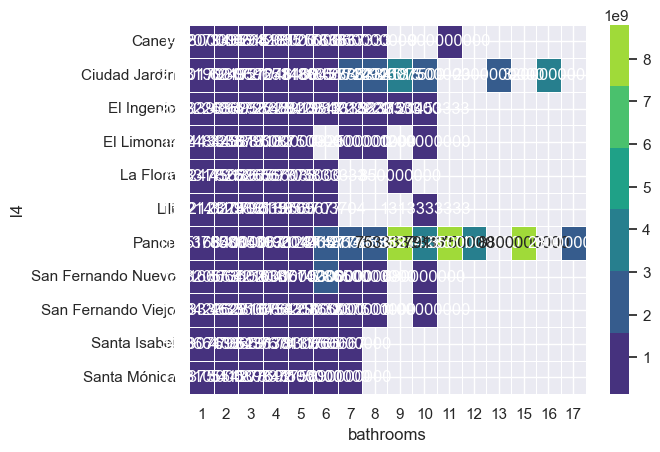

In [18]:
sns.heatmap(bathrooms_sector, cmap=sns.color_palette('viridis'), annot=True, fmt='.0f', linewidths=.5);

El gráfico anterior es difícil de leer porque hay demasiados barrios y los números son muy grandes. Vamos a mejorarlo:
1. Ajustar el tamaño de la figura
2. Filtrar solo columnas con número razonable de baños (< 8)
3. Mostrar los precios en **millones de pesos**
4. Agregar títulos descriptivos

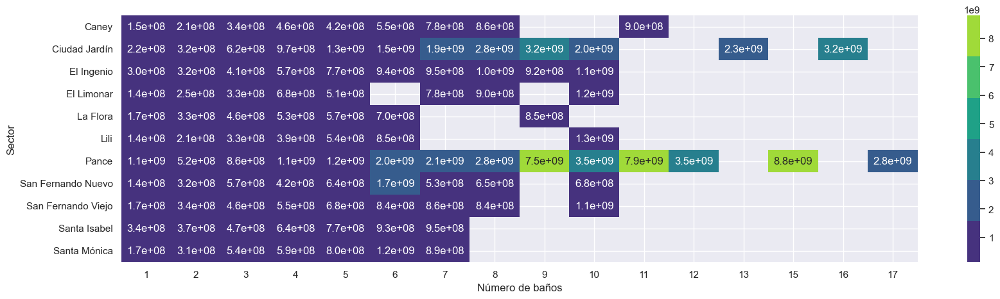

In [17]:
plt.figure(figsize=(20, 5))
sns.heatmap(
    bathrooms_sector, 
    cmap=sns.color_palette('viridis'), 
    annot=True, 
    fmt='.1e'
)
plt.ylabel('Sector')
plt.xlabel('Número de baños')
plt.show()

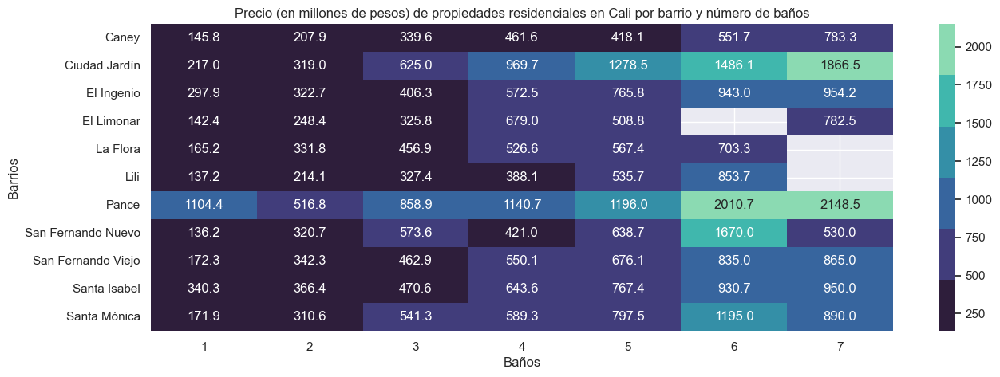

In [19]:
# Versión mejorada: solo baños < 8 y precios en millones
plt.figure(figsize=(15, 5))
sns.heatmap(
    bathrooms_sector[bathrooms_sector.columns[bathrooms_sector.columns < 8]] / 1_000_000,
    cmap=sns.color_palette('mako'),
    annot=True,
    fmt='.1f'
)
plt.title('Precio (en millones de pesos) de propiedades residenciales en Cali por barrio y número de baños')
plt.xlabel('Baños')
plt.ylabel('Barrios')
plt.show()

**¿Qué podemos concluir?**
- Los barrios con propiedades más costosas tienden a tener más baños
- Los colores más claros (mayor precio) se concentran hacia la derecha (más baños)
- Algunos barrios no tienen datos para ciertas combinaciones (celdas vacías)

---
## Bloque 3: Introducción a Plotly

Hasta ahora hemos trabajado con Matplotlib y Seaborn, que generan gráficos **estáticos** (imágenes). **Plotly** es una librería que genera gráficos **interactivos**: puedes hacer zoom, pasar el mouse sobre los puntos para ver sus valores, y filtrar datos directamente en el gráfico.

### ¿Cuándo usar cada librería?

| Característica | Matplotlib/Seaborn | Plotly |
|---------------|-------------------|--------|
| Tipo de gráfico | Estático (imagen) | Interactivo (HTML) |
| Ideal para | Reportes, papers, notebooks | Dashboards, exploración, presentaciones |
| Personalización | Muy alta (pero verbosa) | Alta (con menos código) |
| Curva de aprendizaje | Moderada | Baja con `plotly.express` |

In [ ]:
#!pip install plotly

In [20]:
import plotly.express as px

### 3.1 De Seaborn a Plotly: gráficos equivalentes

Veamos cómo hacer en Plotly algunos gráficos que ya conocemos de Seaborn. La idea es que vean las similitudes y diferencias.

#### Histograma: distribución de precios

Primero veamos el histograma en **Seaborn** (estático):

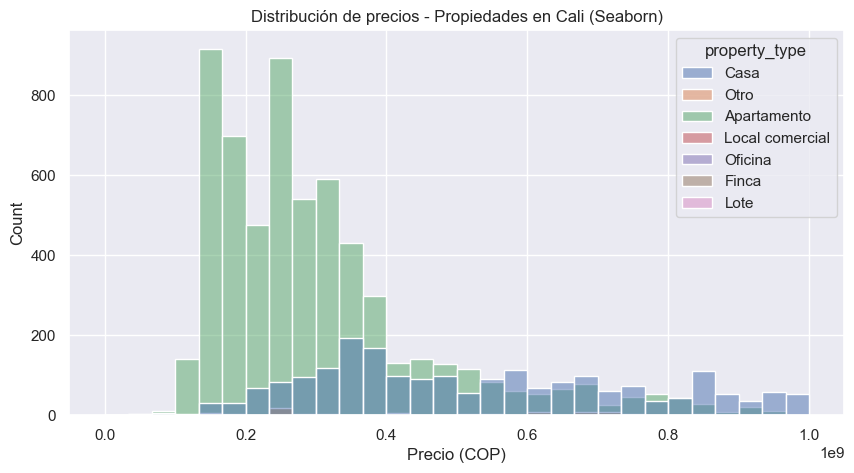

In [45]:
# Versión Seaborn (estático)
plt.figure(figsize=(10, 5))
sns.histplot(
    data=propiedades_venta_cali[propiedades_venta_cali.price < 1e9], 
    x='price', 
    hue='property_type', 
    bins=30
)
plt.title('Distribución de precios - Propiedades en Cali (Seaborn)')
plt.xlabel('Precio (COP)')
plt.show()

Ahora el mismo gráfico en **Plotly** (interactivo). Note que puede pasar el mouse sobre las barras para ver los conteos exactos:

> **Marca (exportación):** En la celda siguiente se guarda el gr?fico interactivo en `.html`.

In [46]:
# Versión Plotly (interactivo)
fig = px.histogram(
    propiedades_venta_cali[propiedades_venta_cali.price < 1e9],
    x='price',
    color='property_type',
    nbins=30,
    title='Distribución de precios - Propiedades en Cali (Plotly)',
    labels={'price': 'Precio (COP)', 'property_type': 'Tipo'}
)
fig.show()



In [48]:
# Exportar gráfico de Plotly
import os
os.makedirs('./exports', exist_ok=True)
fig.write_html('./exports/histograma_precios_plotly.html', include_plotlyjs='cdn')


#### Diagrama de dispersión

Comparemos un scatter plot básico:

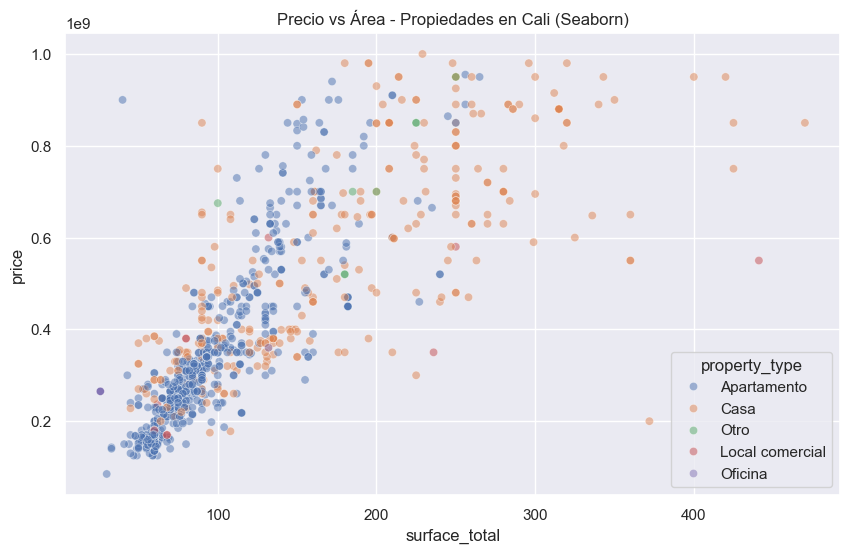

In [23]:
# Versión Seaborn
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=propiedades_venta_cali[
        (propiedades_venta_cali.price < 1e9) & 
        (propiedades_venta_cali.surface_total < 500)
    ],
    x='surface_total',
    y='price',
    hue='property_type',
    alpha=0.5
)
plt.title('Precio vs Área - Propiedades en Cali (Seaborn)')
plt.show()

In [26]:
# Versión Plotly - ¡Pase el mouse sobre los puntos!
fig = px.scatter(
    propiedades_venta_cali[
        (propiedades_venta_cali.price < 1e9) & 
        (propiedades_venta_cali.surface_total < 500)
    ],
    x='surface_total',
    y='price',
    color='property_type',
    opacity=0.5,
    title='Precio vs Área - Propiedades en Cali (Plotly)',
    labels={'surface_total': 'Área total (m²)', 'price': 'Precio (COP)', 'property_type': 'Tipo'}
)
fig.show()

**Ventaja clave de Plotly:** al pasar el mouse sobre cualquier punto, se puede ver exactamente cuál es su precio y área. Esto es muy útil para explorar datos.

### 3.2 Gráficos de barra interactivos

Ahora queremos entender cómo cambia el precio promedio de los arriendos de casas en Medellín con el tiempo. Para esto necesitamos:
1. Filtrar arriendos de casas en Medellín
2. Crear una columna de mes (año-mes)
3. Calcular el promedio por mes
4. Graficar

In [27]:
# Convertimos la columna de fecha
propiedades['created_on'] = pd.to_datetime(propiedades['created_on'])

In [28]:
# Filtramos arriendos de casas en Medellín en COP
arriendos_med = (
    propiedades.loc[
        (propiedades.l3 == 'Medellín') & 
        (propiedades.property_type == 'Casa') &
        (propiedades.currency == 'COP') & 
        (propiedades.operation_type == 'Arriendo'),
        ['created_on', 'surface_covered', 'price']
    ].dropna(subset='surface_covered')
)
arriendos_med

,created_on,surface_covered,price
1300,2020-10-07,500.0,6000000.0
7886,2020-11-28,144.0,1700000.0
12907,2021-02-12,380.0,8000000.0
28610,2021-02-26,170.0,2000000.0
29976,2021-01-05,70.0,1300000.0
...,...,...,...
972358,2020-08-25,400.0,6500000.0
972361,2020-08-25,783.0,15000000.0
982620,2021-05-08,140.0,1700000.0
988012,2020-12-17,315.0,9000000.0


Necesitamos crear una columna con el año y mes para poder agrupar. Usamos `apply` con un formato de texto:

In [29]:
# Creamos la columna de mes en formato 'YYYY-MM'
arriendos_med['mes'] = arriendos_med['created_on'].apply(lambda x: f'{x.year}-{x.month:02}')

In [30]:
# Agrupamos por mes y calculamos el promedio
arriendos_med = arriendos_med.groupby('mes').mean(numeric_only=True).reset_index()
arriendos_med

,mes,surface_covered,price
0,2020-07,328.800000,6.630000e+06
1,2020-08,259.875000,4.431250e+06
2,2020-09,164.368421,2.942421e+06
3,2020-10,243.600000,4.360000e+06
4,2020-11,197.800000,4.428000e+06
5,2020-12,282.189189,6.325838e+06
6,2021-01,292.450000,5.885000e+06
7,2021-02,307.347826,8.082870e+06
8,2021-03,192.000000,3.313733e+06
9,2021-04,96.000000,1.600000e+06


In [31]:
# Gráfico de barras interactivo con Plotly
fig = px.bar(
    arriendos_med, 
    x='mes', 
    y='price', 
    color='surface_covered',
    title='Precios promedio de arriendos de casas en Medellín',
    labels={'price': 'Precio mensual', 'mes': 'Mes', 'surface_covered': 'Área cubierta'}
)
fig.show()

**Observe:** el color de las barras representa el área cubierta promedio. Plotly automáticamente agrega una barra de color y permite interactuar con el gráfico.

### 3.3 Gráficos de burbuja

Un gráfico de burbuja es un scatter plot donde el **tamaño** de cada punto representa una tercera variable numérica. En Plotly, esto se logra con `px.scatter()` y el parámetro `size`.

In [32]:
# Preparamos datos de Bogotá
datos_burbuja = propiedades[
    (propiedades.l3 == 'Bogotá D.C') & 
    (propiedades.price < 1e10) & 
    (propiedades.currency == 'COP')
].dropna(subset='bedrooms')

print(f'Registros: {datos_burbuja.shape[0]:,}')

Registros: 105,888


In [33]:
fig = px.scatter(
    datos_burbuja, 
    x='surface_total', 
    y='price',
    size='bedrooms', 
    color='property_type',
    hover_name='title',
    hover_data=['bedrooms', 'property_type'],
    log_y=True, 
    log_x=True, 
    size_max=60,
    title='Precio de propiedades en Bogotá en función del área superficial y el número de habitaciones',
    labels={
        'price': 'Precio (COP)',
        'surface_total': 'Área superficial (m²)',
        'property_type': 'Tipo',
        'bedrooms': 'Habitaciones'
    }
)
fig.show()

**Nota:** usamos escalas logarítmicas (`log_x=True`, `log_y=True`) porque los datos tienen un rango muy amplio. Esto comprime los valores grandes y expande los pequeños, permitiendo ver mejor la distribución.

---
## Bloque 4: Introducción a GeoPandas

**GeoPandas** extiende Pandas para trabajar con datos geográficos. Permite leer archivos con geometrías (como GeoJSON o Shapefiles) y crear mapas directamente en Python.

In [ ]:
#!pip install geopandas

In [34]:
import geopandas as gpd

#### Zonificación de aptitud para el cultivo de café 

In [42]:
zonas = pd.read_csv('./data/cafe_colombia_short.csv')
zonas.head()

,the_geom,Municipio,Departamento,Código departamento,Código municipio,Gridcode,Área (ha),Aptitud,Consecutivo
0,MULTIPOLYGON (((-75.16039163489766 2.666864226...,Algeciras,Huila,41,41020,8,"36,670.47",Exclusión legal,135
1,MULTIPOLYGON (((-75.63898523287205 6.046078746...,Caldas,Antioquia,5,5129,0,"1,092.27",No apta,279
2,MULTIPOLYGON (((-75.37286486758364 5.760060055...,Abejorral,Antioquia,5,5002,0,"13,323.43",No apta,468
3,MULTIPOLYGON (((-75.51089662152991 5.854658972...,Abejorral,Antioquia,5,5002,0,"11,153.19",No apta,518
4,MULTIPOLYGON (((-75.48034054741446 5.832850249...,Abejorral,Antioquia,5,5002,3,"5,373.82",Aptitud alta,971


In [43]:
zonas.shape

(1000, 9)

In [37]:
zonas_ant = zonas[zonas.Departamento == 'Antioquia'].drop_duplicates(subset='Municipio').copy()

In [38]:
# Corregir el formato de la columna 'Área (ha)' para eliminar caracteres no numéricos y convertir a float
zonas_ant.loc[:, 'Área (ha)'] = (
    zonas_ant['Área (ha)']
    .astype(str)
    .str.replace(',', '', regex=False)
    .astype(float)
)

In [39]:
zonas_ant['Área (ha)'] = zonas_ant['Área (ha)'].astype(float)
zonas_ant['Área (ha)'].describe()

count        36.000000
mean       9044.377222
std       31248.737582
min           0.000000
25%         173.680000
50%        1343.895000
75%        3918.177500
max      186894.810000
Name: Área (ha), dtype: float64

In [40]:
zonas_ant.info()

<class 'pandas.core.frame.DataFrame'>
Index: 36 entries, 1 to 977
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   the_geom             36 non-null     object 
 1   Municipio            36 non-null     object 
 2   Departamento         36 non-null     object 
 3   Código departamento  36 non-null     int64  
 4   Código municipio     36 non-null     int64  
 5   Gridcode             36 non-null     int64  
 6   Área (ha)            36 non-null     float64
 7   Aptitud              36 non-null     object 
 8   Consecutivo          36 non-null     object 
dtypes: float64(1), int64(3), object(5)
memory usage: 2.8+ KB


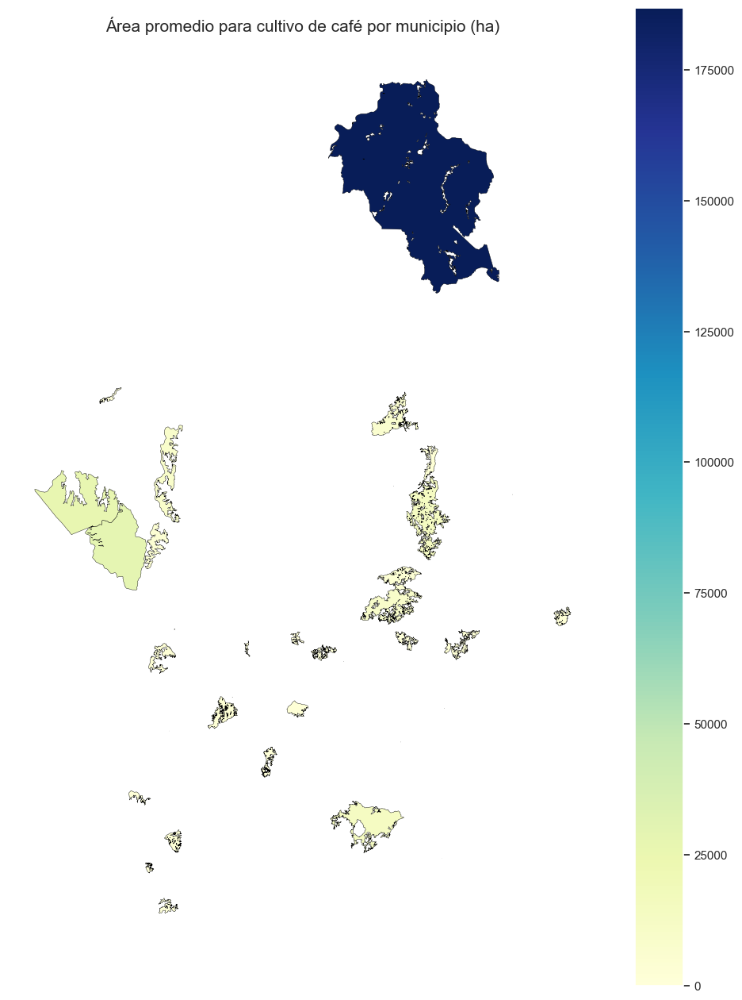

In [41]:
from shapely import wkt

zonas_ant['geometry'] = zonas_ant['the_geom'].apply(wkt.loads)

# Crear GeoDataFrame
gdf = gpd.GeoDataFrame(zonas_ant, geometry='geometry', crs='EPSG:4326')

# Graficar el área (ha)
fig, ax = plt.subplots(figsize=(12, 16))

gdf.plot(
    column='Área (ha)',
    cmap='YlGnBu',
    legend=True,
    edgecolor='black',
    linewidth=0.3,
    ax=ax,
)

plt.title('Área promedio para cultivo de café por municipio (ha)', fontsize=15)
plt.axis('off')
plt.show()

**¿Qué significa EPSG:4326?**

EPSG es un sistema estándar que define códigos únicos para distintos sistemas de coordenadas.

4326 es el código EPSG que corresponde al sistema de coordenadas WGS 84 (World Geodetic System 1984), que es:
- El sistema más usado globalmente (por GPS, OpenStreetMap, Google Maps…)
- Basado en grados decimales: latitud y longitud (ejemplo: (-75.5, 6.2))

In [ ]:
# Cargar mapa de municipios de Colombia desde GitHub
url = 'https://raw.githubusercontent.com/finiterank/mapa-colombia-js/master/colombia-municipios.json'
gdf_municipios = gpd.read_file(url)

In [ ]:
# Ver columnas disponibles
print(gdf_municipios.columns)

In [ ]:
gdf_municipios

In [ ]:
# Visualizar mapa de Colombia
gdf_municipios.plot(edgecolor='navy', figsize=(10, 20));

## Taller

In [50]:
import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns

El Departamento de Transporte de Estados Unidos rastrea el rendimiento de los vuelos domésticos operados por las principales transportadoras aéreas del país. A continuación, se presentan los datos de los vuelos a tiempo, retrasados, cancelados y desvíados para el año 2015.

Primero, importemos los dataframes y hagamos una exploración.

In [51]:
aerolineas = pd.read_csv('./data/airlines.csv')

In [52]:

aerolineas.head()

,IATA_CODE,AIRLINE
0,UA,United Air Lines Inc.
1,AA,American Airlines Inc.
2,US,US Airways Inc.
3,F9,Frontier Airlines Inc.
4,B6,JetBlue Airways


Este parece ser un diccionario de las aerolíneas y su código único IATA (Asociación Internacional de Transporte Aéreo).

In [53]:
aeropuertos = pd.read_csv('./data/airports.csv')
print(aeropuertos.shape)
aeropuertos.head()

(322, 7)


,IATA_CODE,AIRPORT,CITY,STATE,COUNTRY,LATITUDE,LONGITUDE
0,ABE,Lehigh Valley International Airport,Allentown,PA,USA,40.65236,-75.44040
1,ABI,Abilene Regional Airport,Abilene,TX,USA,32.41132,-99.68190
2,ABQ,Albuquerque International Sunport,Albuquerque,NM,USA,35.04022,-106.60919
3,ABR,Aberdeen Regional Airport,Aberdeen,SD,USA,45.44906,-98.42183
4,ABY,Southwest Georgia Regional Airport,Albany,GA,USA,31.53552,-84.19447


En este caso tenemos la información de 322 aeropuertos como su código IATA, su nombre completo, la ciudad y el estado al que pertenecen así como sus coordenadas geográficas.

In [55]:
vuelos = pd.read_csv('./data/flights.csv')
print(vuelos.shape)
vuelos.head()

C:\Users\Santiago Neira\AppData\Local\Temp\ipykernel_8020\3068428617.py:1: DtypeWarning:

Columns (7,8) have mixed types. Specify dtype option on import or set low_memory=False.



(5819079, 31)


,YEAR,MONTH,DAY,DAY_OF_WEEK,AIRLINE,FLIGHT_NUMBER,TAIL_NUMBER,ORIGIN_AIRPORT,DESTINATION_AIRPORT,SCHEDULED_DEPARTURE,DEPARTURE_TIME,DEPARTURE_DELAY,TAXI_OUT,WHEELS_OFF,SCHEDULED_TIME,ELAPSED_TIME,AIR_TIME,DISTANCE,WHEELS_ON,TAXI_IN,SCHEDULED_ARRIVAL,ARRIVAL_TIME,ARRIVAL_DELAY,DIVERTED,CANCELLED,CANCELLATION_REASON,AIR_SYSTEM_DELAY,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY
0,2015,1,1,4,AS,98,N407AS,ANC,SEA,5,2354.0,-11.0,21.0,15.0,205.0,194.0,169.0,1448,404.0,4.0,430,408.0,-22.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
1,2015,1,1,4,AA,2336,N3KUAA,LAX,PBI,10,2.0,-8.0,12.0,14.0,280.0,279.0,263.0,2330,737.0,4.0,750,741.0,-9.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
2,2015,1,1,4,US,840,N171US,SFO,CLT,20,18.0,-2.0,16.0,34.0,286.0,293.0,266.0,2296,800.0,11.0,806,811.0,5.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
3,2015,1,1,4,AA,258,N3HYAA,LAX,MIA,20,15.0,-5.0,15.0,30.0,285.0,281.0,258.0,2342,748.0,8.0,805,756.0,-9.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,2015,1,1,4,AS,135,N527AS,SEA,ANC,25,24.0,-1.0,11.0,35.0,235.0,215.0,199.0,1448,254.0,5.0,320,259.0,-21.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


Observe que tenemos 5,819,079 registros y aún así el tiempo de lectura fue corto. No obstante, como tenemos 31 columnas no es tan fácil visualizar toda la tabla. Para esto podemos cambiar el máximo número de columnas visualizadas utilizando:

In [56]:
pd.set_option('display.max_columns', 32)

In [57]:
vuelos.head()

,YEAR,MONTH,DAY,DAY_OF_WEEK,AIRLINE,FLIGHT_NUMBER,TAIL_NUMBER,ORIGIN_AIRPORT,DESTINATION_AIRPORT,SCHEDULED_DEPARTURE,DEPARTURE_TIME,DEPARTURE_DELAY,TAXI_OUT,WHEELS_OFF,SCHEDULED_TIME,ELAPSED_TIME,AIR_TIME,DISTANCE,WHEELS_ON,TAXI_IN,SCHEDULED_ARRIVAL,ARRIVAL_TIME,ARRIVAL_DELAY,DIVERTED,CANCELLED,CANCELLATION_REASON,AIR_SYSTEM_DELAY,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY
0,2015,1,1,4,AS,98,N407AS,ANC,SEA,5,2354.0,-11.0,21.0,15.0,205.0,194.0,169.0,1448,404.0,4.0,430,408.0,-22.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
1,2015,1,1,4,AA,2336,N3KUAA,LAX,PBI,10,2.0,-8.0,12.0,14.0,280.0,279.0,263.0,2330,737.0,4.0,750,741.0,-9.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
2,2015,1,1,4,US,840,N171US,SFO,CLT,20,18.0,-2.0,16.0,34.0,286.0,293.0,266.0,2296,800.0,11.0,806,811.0,5.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
3,2015,1,1,4,AA,258,N3HYAA,LAX,MIA,20,15.0,-5.0,15.0,30.0,285.0,281.0,258.0,2342,748.0,8.0,805,756.0,-9.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,2015,1,1,4,AS,135,N527AS,SEA,ANC,25,24.0,-1.0,11.0,35.0,235.0,215.0,199.0,1448,254.0,5.0,320,259.0,-21.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


Veamos algunas descripciones de las columnas de los datos:

- **YEAR, MONTH, DAY**: Información sobre la fecha del vuelo.
- **AIRLINE**: Código IATA de la aerolínea.
- **FLIGHT_NUMBER**: Número del vuelo
- **TAIL_NUMBER**: Modelo del avión
- **ORIGIN_AIRPORT, DESTINATION_AIRPORT**: Código IATA del aeropuerto de origen y de destino respectivamente
- **SCHEDULED_DEPARTURE**: Hora del vuelo programada para la salida en formato 24H, es decir HHMM.
- **DEPARTURE_TIME**: Hora del vuelo real de la salida en formato 24H, es decir HHMM.
- **WHEELS OFF**: La hora a la que las llantas despegan. En format 24H (HHMM).
- **SCHEDULED_TIME**: El tiempo programado para la duración del vuelo.
- **AIR_TIME**: El tiempo que la aeronave estuvo en el aire en minutos.
- **DISTANCE**: La distancia recorrida en millas.
- **WHEELS_ON**: La hora a la que las llantas aterrizan. En format 24H (HHMM).
- **SCHEDULED_ARRIVAL**: Hora del vuelo programada para la llegada en formato 24H, es decir HHMM.
- **ARRIVAL_TIME**: Hora del vuelo real de la llegada en formato 24H, es decir HHMM.
- **DIVERTED, CANCELLED**: Si el vuelo fue desvíado o cancelado.
- **CANCELLATION_REASON**: Si el vuelo fue cancelado, indica la razón de su cancelación. Puede ser
    - _A_: Debido a problemas con la aerolínea.
    - _B_: Debido al clima.
    - _C_: Debido a restricciones del espacio aéreo (NAS)
    - _D_: Por razones de seguridad.
- **AIR_SYSTEM_DELAY, SECURITY_DELAY, AIRLINE_DELAY, LATE_AIRCRAFT_DELAY, WEATHER_DELAY**: Demoras en minutos debido al espacio aéreo, a la seguridad del viaje, a la aerolínea, a una aeronave tardía, al clima respectivamente.


1. ¿Cuál es el día de la semana dónde hay más vuelos retrasados? ¿Y más vuelos cancelados?

In [58]:
dict_day = {0: 'Lunes', 1:'Martes', 2:'Miércoles',3:'Jueves',4:'Viernes',5:'Sábado',6:'Domingo'}

In [59]:
vuelos['DIA_DE_SEMANA'] = pd.to_datetime(vuelos[['YEAR','MONTH','DAY']]).apply(lambda d: dict_day[d.day_of_week])

2. ¿Cuál es la aerolínea con más retrasos superiores a 45 min? ¿Y cancelaciones? Construya un gráfico de barras con el total de retrasos superiores a 45 min y cancelaciones por aerolínea?

3. Construya las distribuciones de la velocidad promedio (km/h) y la distancia (km) recorrida en los vuelos? ¿Cuál es la mediana de la velocidad promedio?

In [60]:
vuelos['DISTANCE_KM'] = vuelos['DISTANCE']*1.60934

In [61]:
vuelos['VELOCIDAD_PROMEDIO'] = vuelos['DISTANCE_KM']/(vuelos['AIR_TIME']/60)

4. Construya el mapa de calor de correlaciones para las variables de *VELOCIDAD_PROMEDIO, DISTANCE, AIR_TIME, TAXI_OFF, DEPARTURE_DELAY, ARRIVAL_DELAY*. ¿Cuáles tienen una correlación negativa?

In [62]:
corr = vuelos[['VELOCIDAD_PROMEDIO','DISTANCE','AIR_TIME','TAXI_OUT','DEPARTURE_DELAY','ARRIVAL_DELAY']].corr()
corr.head()

,VELOCIDAD_PROMEDIO,DISTANCE,AIR_TIME,TAXI_OUT,DEPARTURE_DELAY,ARRIVAL_DELAY
VELOCIDAD_PROMEDIO,1.000000,0.696711,0.612559,-0.015978,0.029040,-0.073322
DISTANCE,0.696711,1.000000,0.985643,0.072333,0.024106,-0.025444
AIR_TIME,0.612559,0.985643,1.000000,0.087608,0.023495,-0.007108
TAXI_OUT,-0.015978,0.072333,0.087608,1.000000,0.058515,0.227319
DEPARTURE_DELAY,0.029040,0.024106,0.023495,0.058515,1.000000,0.944672


5. Construya un gráfico de barras de la suma de la distancia total que recorrió cada aerolínea.

6. Los retrasos son comunmente clasificados en: _ligero retraso_ (hasta 15 min), _retraso medio_ (de 15 a 45 min) y _retraso severo_ (mayor a 45 min). Utilizando estas categorías construya un gráfico de barras del número de estos tipos de retraso de llegada para los 5 aeropuertos de destino con mayor número de vuelos.

In [63]:
aeropuertos_principales = vuelos['DESTINATION_AIRPORT'].value_counts().reset_index().iloc[:5].DESTINATION_AIRPORT.values
aeropuertos_principales

array(['ATL', 'ORD', 'DFW', 'DEN', 'LAX'], dtype=object)

7. ¿Qué ciudad tiene más vuelos cancelados debido al clima como una proporción de los vuelos totales por ciudad?

8. Elabore un gráfico de línea de las 5 aerolíneas con más retrasos para ver su total de retrasos por mes a lo largo del año.

In [67]:
aerolineas_mas_retrasadas = vuelos[~(vuelos['DIVERTED']==0)]\
    .groupby('AIRLINE').count()['DAY'].sort_values(ascending=False).iloc[:5].index
aerolineas_mas_retrasadas

Index(['WN', 'AA', 'EV', 'DL', 'OO'], dtype='object', name='AIRLINE')